### **<font color='blue'> Artistic Colorizer </font>**

#◢ DeOldify - Colorize your own photos!

####**Credits:**

Special thanks to:

Matt Robinson and María Benavente for pioneering the DeOldify image colab notebook.  

Dana Kelley for doing things, breaking stuff & having an opinion on everything.



---


#◢ Verify Correct Runtime Settings

**<font color='#FF000'> IMPORTANT </font>**

In the "Runtime" menu for the notebook window, select "Change runtime type." Ensure that the following are selected:
* Runtime Type = Python 3
* Hardware Accelerator = GPU 


#◢ Git clone and install DeOldify

In [1]:
!git clone https://github.com/jantic/DeOldify.git DeOldify 

Cloning into 'DeOldify'...
remote: Enumerating objects: 8, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 2091 (delta 4), reused 1 (delta 0), pack-reused 2083
Receiving objects: 100% (2091/2091), 69.35 MiB | 35.81 MiB/s, done.
Resolving deltas: 100% (940/940), done.


In [2]:
cd DeOldify

/content/DeOldify


#◢ Setup

In [3]:
#NOTE:  This must be the first call in order to work properly!
from deoldify import device
from deoldify.device_id import DeviceId
#choices:  CPU, GPU0...GPU7
device.set(device=DeviceId.GPU0)

import torch

if not torch.cuda.is_available():
    print('GPU not available.')

from os import path

In [ ]:
!pip install -r colab_requirements.txt

In [7]:
import fastai
from deoldify.visualize import *
import warnings
warnings.filterwarnings("ignore", category=UserWarning, message=".*?Your .*? set is empty.*?")

**Model for image colorizer:**

In [8]:
!mkdir 'models'
!wget https://www.dropbox.com/s/zkehq1uwahhbc2o/ColorizeArtistic_gen.pth?dl=0 -O ./models/ColorizeArtistic_gen.pth # 243MB
!wget -q https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png -O ./resource_images/watermark.png
colorizer = get_image_colorizer(artistic=True)

# (( ps: notice the nice progress bar? see https://towardsdatascience.com/progress-bars-in-python-4b44e8a4c482 ))

--2020-07-12 11:44:51--  https://www.dropbox.com/s/zkehq1uwahhbc2o/ColorizeArtistic_gen.pth?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.1, 2620:100:6018:1::a27d:301
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/zkehq1uwahhbc2o/ColorizeArtistic_gen.pth [following]
--2020-07-12 11:44:51--  https://www.dropbox.com/s/raw/zkehq1uwahhbc2o/ColorizeArtistic_gen.pth
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucbe30a3eb3e88ee46e24f7fc796.dl.dropboxusercontent.com/cd/0/inline/A7b2EYg9IlzzPPKNTi8ZRa6EpD9UKYxUyK-Bv81H81JgU9MYTOTpcItx_dqZWcWhkClkJ3W5IolqnL57E6XUGPE6jizvMFhKkjLfCTae2Ac5Xw/file# [following]
--2020-07-12 11:44:51--  https://ucbe30a3eb3e88ee46e24f7fc796.dl.dropboxusercontent.com/cd/0/inline/A7b2EYg9IlzzPPKNTi8ZRa6EpD9UKYxUyK-Bv81H81JgU9MYTOTpcItx_dqZWcWhkClkJ3W5IolqnL57E6XUGPE6jizvMF

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth


In [ ]:
# alternative "stable" model
#!mkdir 'models'
#!wget https://www.dropbox.com/s/mwjep3vyqk5mkjc/ColorizeStable_gen.pth?dl=0 -O ./models/ColorizeStable_gen.pth
#colorizer = get_image_colorizer(artistic=False)

**Model for video colorizer:**

In [9]:
from os import path
#!mkdir 'models'
!wget https://www.dropbox.com/s/336vn9y4qwyg9yz/ColorizeVideo_gen.pth?dl=0 -O ./models/ColorizeVideo_gen.pth # 834MB !
!wget -q https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png -O ./resource_images/watermark.png
colorizer_vid = get_video_colorizer()

--2020-07-12 11:45:17--  https://www.dropbox.com/s/336vn9y4qwyg9yz/ColorizeVideo_gen.pth?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.1, 2620:100:6018:1::a27d:301
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/336vn9y4qwyg9yz/ColorizeVideo_gen.pth [following]
--2020-07-12 11:45:17--  https://www.dropbox.com/s/raw/336vn9y4qwyg9yz/ColorizeVideo_gen.pth
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc3d9f8c68777f450e6276fddbb9.dl.dropboxusercontent.com/cd/0/inline/A7a8yVR0Ck5edEDgiJNpnSD3m1sNcrfVzhOryHmnUe4wsCfAp_lxwBaBSQW4u1Op1_0nTS_s5pnHQ5DsKg4fsjMJ-NBFOju31dx0Irdv-Tw4Kw/file# [following]
--2020-07-12 11:45:17--  https://uc3d9f8c68777f450e6276fddbb9.dl.dropboxusercontent.com/cd/0/inline/A7a8yVR0Ck5edEDgiJNpnSD3m1sNcrfVzhOryHmnUe4wsCfAp_lxwBaBSQW4u1Op1_0nTS_s5pnHQ5DsKg4fsjMJ-NBFOju31dx0Ird

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/checkpoints/resnet101-5d3b4d8f.pth


#◢ Instructions

### source_url
Type in a url to a direct link of an image.  Usually that means they'll end in .png, .jpg, etc. NOTE: If you want to use your own image, upload it first to a site like Imgur. 

### render_factor
The default value of 35 has been carefully chosen and should work -ok- for most scenarios (but probably won't be the -best-). This determines resolution at which the color portion of the image is rendered. Lower resolution will render faster, and colors also tend to look more vibrant. Older and lower quality images in particular will generally benefit by lowering the render factor. Higher render factors are often better for higher quality images, but the colors may get slightly washed out. 

### watermarked
Selected by default, this places a watermark icon of a palette at the bottom left corner of the image.  This is intended to be a standard way to convey to others viewing the image that it is colorized by AI. We want to help promote this as a standard, especially as the technology continues to improve and the distinction between real and fake becomes harder to discern. This palette watermark practice was initiated and lead by the company MyHeritage in the MyHeritage In Color feature (which uses a newer version of DeOldify than what you're using here).

#### How to Download a Copy
Simply right click on the displayed image and click "Save image as..."!

## Pro Tips

You can evaluate how well the image is rendered at each render_factor by using the code at the bottom (that cell under "See how well render_factor values perform on a frame here"). 

#◢ Colorize - Images:

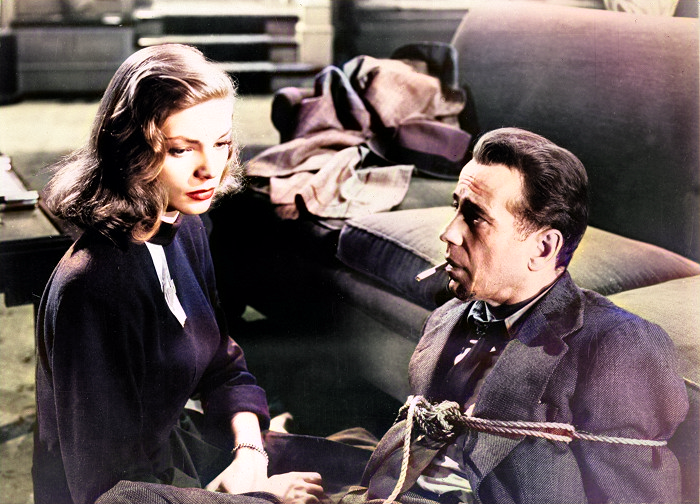

done in 1.3823226750000117 sec.


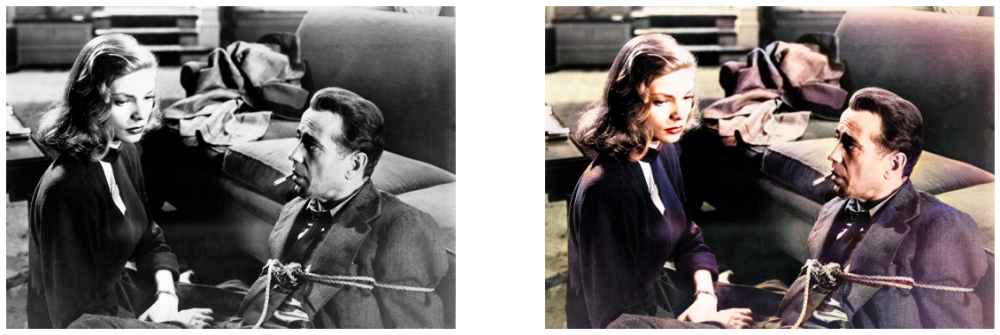

In [16]:
from timeit import default_timer as timer

source_url = 'https://img.csfd.cz/files/images/film/photos/000/095/95104_03da69.jpg?w700' #@param {type:"string"}
render_factor = 35  #@param {type: "slider", min: 7, max: 40}
watermarked = False #@param {type:"boolean"}

# See https://github.com/jantic/DeOldify/blob/edac73edf1d3557f95a71f860cffd6c4c91f66f0/deoldify/visualize.py#L93
# for direct image input

if source_url is not None and source_url !='':
    start = timer()
    image_path = colorizer.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True, watermarked=watermarked)
    show_image_in_notebook(image_path)
    end = timer()
    print("done in", (end - start) , "sec.") # ~ 1.38s = download + process
    
else:
    print('Provide an image url and try again.')

## See how well render_factor values perform on the image here

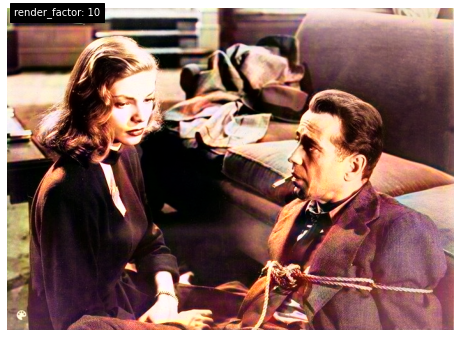

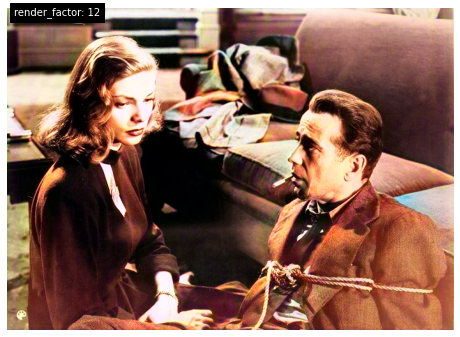

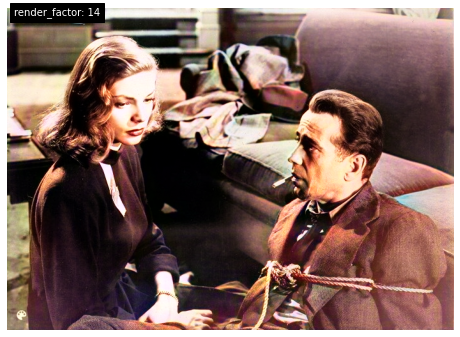

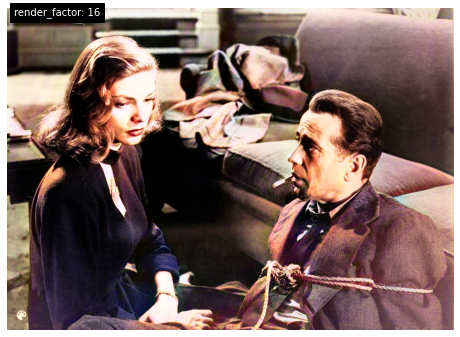

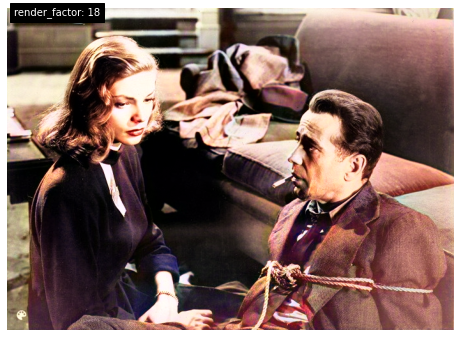

...

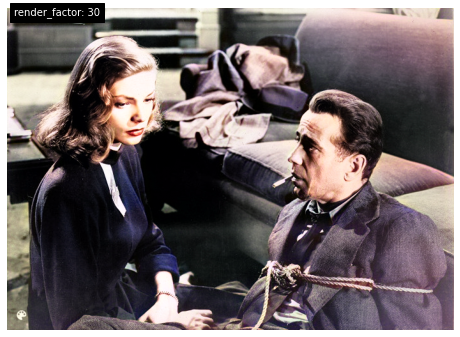

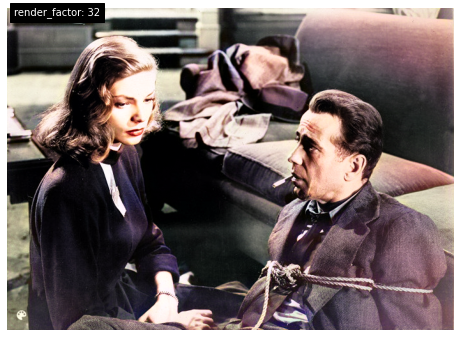

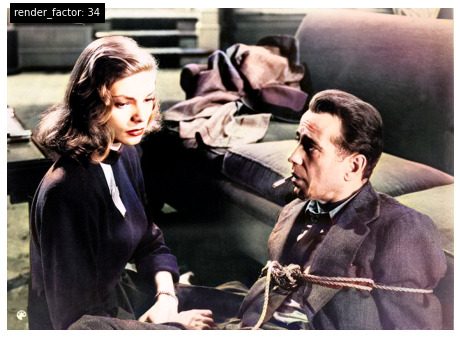

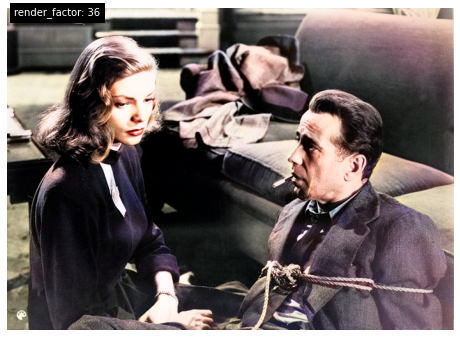

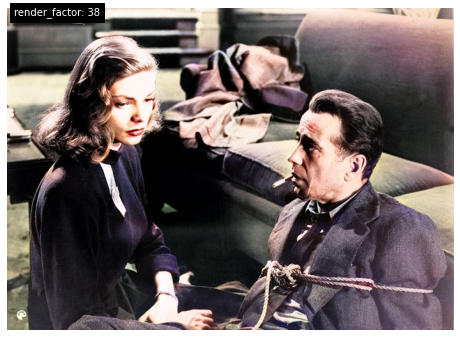

In [ ]:
for i in range(10,40,2):
    colorizer.plot_transformed_image('test_images/image.png', render_factor=i, display_render_factor=True, figsize=(8,8))

#◢ Colorize - Videos:

Type in a url hosting a video from YouTube, Imgur, Twitter, Reddit, Vimeo, etc.  Many sources work!  GIFs also work.  Full list here: https://ytdl-org.github.io/youtube-dl/supportedsites.html NOTE: If you want to use your own video, upload it first to a site like YouTube. 

Trying https://i.imgur.com/FKN9rrn.gifv 

maybe https://www.youtube.com/watch?v=A0D4fHieW8o

In [17]:
source_url = 'https://i.imgur.com/FKN9rrn.gifv' #@param {type:"string"}
render_factor = 21  #@param {type: "slider", min: 5, max: 40}
watermarked = False #@param {type:"boolean"}

if source_url is not None and source_url !='':
    start = timer()
    video_path = colorizer_vid.colorize_from_url(source_url, 'video.mp4', render_factor, watermarked=watermarked)
    show_video_in_notebook(video_path)
    end = timer()
    print("done in", (end - start) , "sec.") # ~ 21 sec = download + process

else:
    print('Provide a video url and try again.')

[Imgur] FKN9rrn: Downloading webpage
[download] Destination: video/source/video.mp4
[download] 100% of 750.71KiB in 00:00


Video created here: video/result/video.mp4


done in 20.993638007000015 sec.


## changes to render_factor:

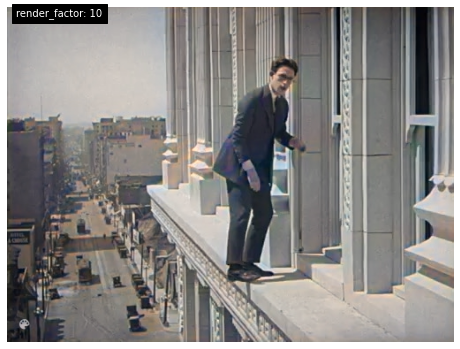

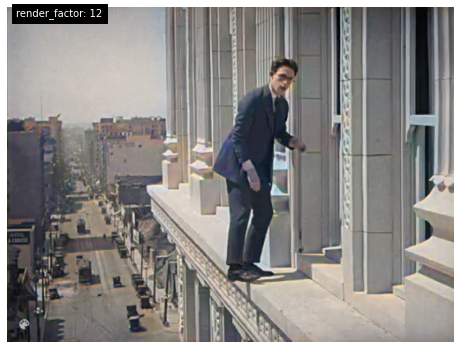

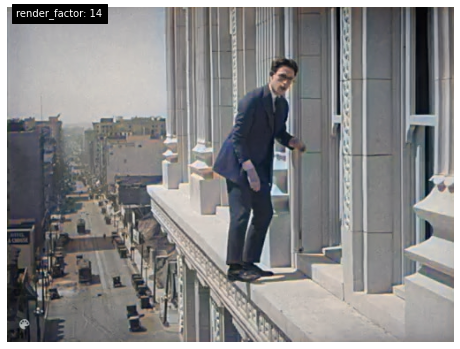

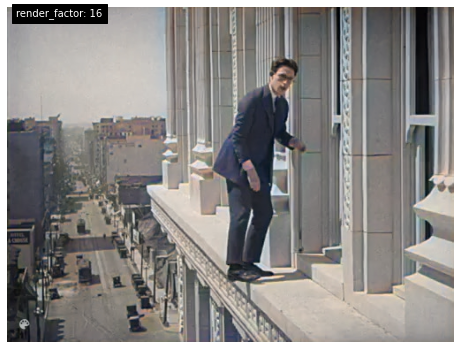

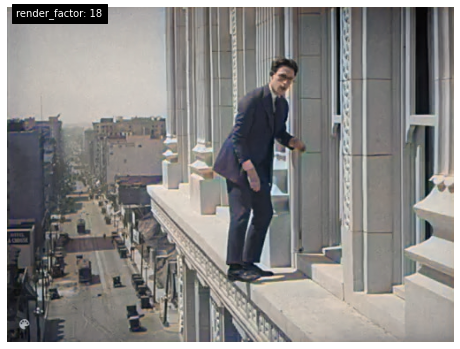

...

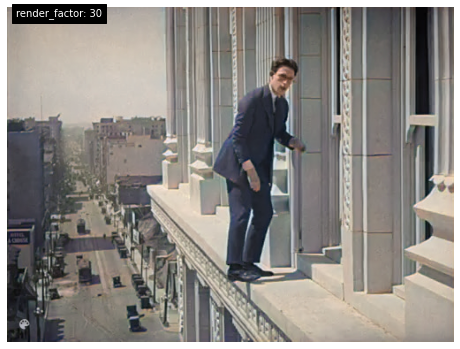

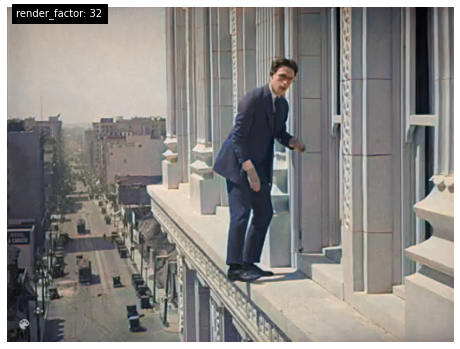

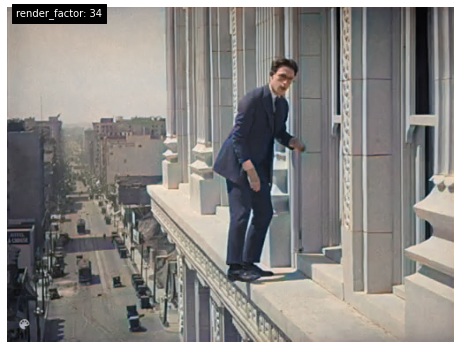

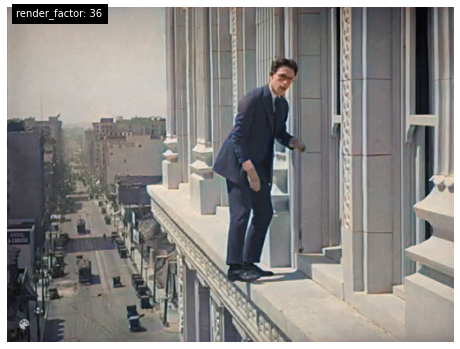

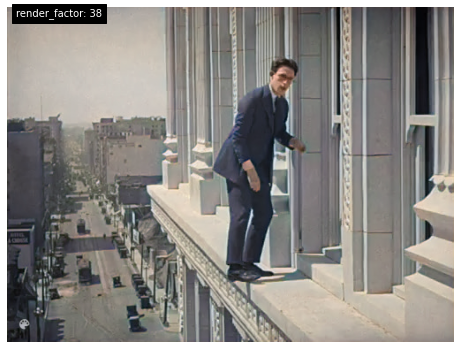

In [11]:
for i in range(10,40,2):
    colorizer_vid.vis.plot_transformed_image('video/bwframes/video/00001.jpg', render_factor=i, display_render_factor=True, figsize=(8,8))

---
#⚙ Recommended image sources 
* [/r/TheWayWeWere](https://www.reddit.com/r/TheWayWeWere/)

---
#⚙ Recommended video and gif sources 
* [/r/Nickelodeons/](https://www.reddit.com/r/Nickelodeons/)
* [r/silentmoviegifs](https://www.reddit.com/r/silentmoviegifs/)
* https://twitter.com/silentmoviegifs 